<a href="https://colab.research.google.com/github/sahin-arslan/SayisalGoruntuIsleme/blob/main/234312029_Sahin_Arslan_SG.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Şahin Arslan

## 1. Veri Yükleme

**1.	Kütüphanelerin İçe Aktarılması**


*   Veri işleme için pandas, sayısal işlemler için numpy, görselleştirme için matplotlib ve seaborn kütüphanelerini içe aktarın.
*   Ayrıca os modülünü kullanarak dosya yolunu belirtin.


In [51]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
from skimage import exposure
import cv2
import random

sns.set()

#tüm projede kullanılan görüntülerin size'ini set ediyoruz (figsize için kullanıyoruz)
fsize = [20,20]

In [52]:
!git clone https://github.com/hardik0/AI-for-Medicine-Specialization
%cd AI-for-Medicine-Specialization/AI-for-Medical-Diagnosis/

Cloning into 'AI-for-Medicine-Specialization'...
remote: Enumerating objects: 1601, done.
remote: Counting objects: 100% (28/28), done.
remote: Compressing objects: 100% (28/28), done.
remote: Total 1601 (delta 9), reused 2 (delta 0), pack-reused 1573 (from 1)
Receiving objects: 100% (1601/1601), 720.36 MiB | 32.09 MiB/s, done.
Resolving deltas: 100% (30/30), done.
Updating files: 100% (1497/1497), done.
/content/AI-for-Medicine-Specialization/AI-for-Medical-Diagnosis/AI-for-Medicine-Specialization/AI-for-Medical-Diagnosis/AI-for-Medicine-Specialization/AI-for-Medical-Diagnosis


**2.	Veri Setinin Yüklenmesi**


*   train_df olarak adlandırılan veri çerçevesine CSV dosyasını yükleyin ve ilk birkaç satırı inceleyin.
*   Toplam satır ve sütun sayısını ekrana yazdırın.


In [53]:
# veri setimizi okuyoruz
train_df = pd.read_csv("nih/train-small.csv")

# ilk on satırını yazdırıyoruz
train_df.head(10)


,Image,Atelectasis,Cardiomegaly,Consolidation,Edema,Effusion,Emphysema,Fibrosis,Hernia,Infiltration,Mass,Nodule,PatientId,Pleural_Thickening,Pneumonia,Pneumothorax
0,00008270_015.png,0,0,0,0,0,0,0,0,0,0,0,8270,0,0,0
1,00029855_001.png,1,0,0,0,1,0,0,0,1,0,0,29855,0,0,0
2,00001297_000.png,0,0,0,0,0,0,0,0,0,0,0,1297,1,0,0
3,00012359_002.png,0,0,0,0,0,0,0,0,0,0,0,12359,0,0,0
4,00017951_001.png,0,0,0,0,0,0,0,0,1,0,0,17951,0,0,0
5,00001232_002.png,1,1,0,0,1,0,0,0,1,0,0,1232,0,0,0
6,00017135_000.png,0,0,0,0,0,0,0,0,0,0,0,17135,0,0,0
7,00027235_000.png,0,0,0,0,0,0,0,0,0,0,0,27235,0,0,0
8,00014197_007.png,0,0,0,0,0,0,0,0,0,0,0,14197,0,0,0
9,00011584_002.png,0,0,0,0,0,0,0,0,0,0,0,11584,0,0,0


In [54]:
print(f'Toplam satır sayısı \t: {train_df.shape[0]}')
print(f'Toplam sutun sayısı \t:   {train_df.shape[1]}')

Toplam satır sayısı 	: 1000
Toplam sutun sayısı 	:   16


**3.	Veri Özelliklerinin İncelenmesi**

*   Sütunlardaki veri türlerini ve eksik değerleri inceleyin.



In [55]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 16 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   Image               1000 non-null   object
 1   Atelectasis         1000 non-null   int64 
 2   Cardiomegaly        1000 non-null   int64 
 3   Consolidation       1000 non-null   int64 
 4   Edema               1000 non-null   int64 
 5   Effusion            1000 non-null   int64 
 6   Emphysema           1000 non-null   int64 
 7   Fibrosis            1000 non-null   int64 
 8   Hernia              1000 non-null   int64 
 9   Infiltration        1000 non-null   int64 
 10  Mass                1000 non-null   int64 
 11  Nodule              1000 non-null   int64 
 12  PatientId           1000 non-null   int64 
 13  Pleural_Thickening  1000 non-null   int64 
 14  Pneumonia           1000 non-null   int64 
 15  Pneumothorax        1000 non-null   int64 
dtypes: int64(15), object(1)
m

*   PatientId sütunundaki benzersiz hasta sayısını analiz edin ve her bir hastanın birden fazla görüntüsü olup olmadığını belirleyin.

In [56]:
total_patient_ids = train_df['PatientId'].count()
unique_patient_ids = train_df['PatientId'].nunique()

print(f"Toplam {total_patient_ids} hasta id'sinden {unique_patient_ids} tanesi benzersizdir.")

if total_patient_ids > unique_patient_ids:
    print("Veri setinde çoklu görüntüye sahip hastalar bulunmaktadır.")
else:
    print("Veri setinde her hasta sadece bir görüntüye sahiptir")

Toplam 1000 hasta id'sinden 928 tanesi benzersizdir.
Veri setinde çoklu görüntüye sahip hastalar bulunmaktadır.


## 2. Görüntü Yükleme ve Görselleştirme

**1.	Rastgele Görüntüler Seçme**


*   train_df içindeki "Image" sütunundan rastgele 9 görüntü seçin.


In [57]:
# veri setinden görüntü kolununu alıyoruz.
images = train_df['Image'].values

random_images_count = 9

# 9 tane random görüntü seciyoruz
random_images = [np.random.choice(images) for i in range(random_images_count)]

# Random secilen görüntüleri yazdırıyoruz.
for image in random_images:
    print(image)

00016030_004.png
00025843_001.png
00015732_027.png
00007676_011.png
00013111_098.png
00028304_000.png
00025234_008.png
00030340_001.png
00025295_004.png


*   Bu görüntüleri yan yana görselleştirerek veri setindeki örnek görüntüleri inceleyin

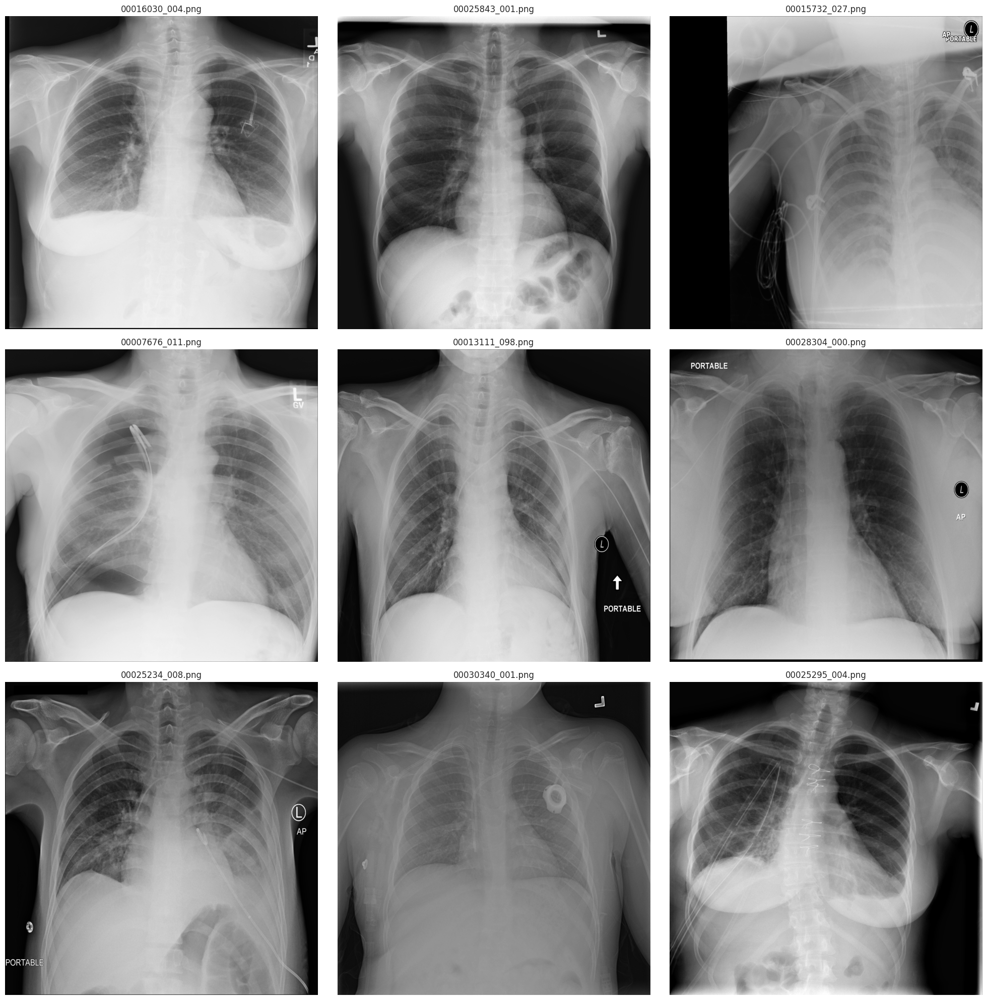

In [58]:
# Görüntülerin yolunu set ediyoruz
img_dir = 'nih/images_small/'

# Görüntülerin boyutunu set ediyoruz.
plt.figure(figsize=fsize)

# Görüntüleri ekrana basma işlemini yapıyoruz
for i in range(random_images_count):
    plt.subplot(3, 3, i + 1)
    img = plt.imread(os.path.join(img_dir, random_images[i]))
    plt.title(f"{random_images[i]}")
    plt.imshow(img, cmap='gray')
    plt.axis('off')

plt.tight_layout()
plt.show()

**2.	Rastgele Görüntülerin İstatistiksel Özelliklerini Hesaplama**

*  Seçilen görüntülerin her biri için maksimum, minimum, ortalama ve standart sapma değerlerini hesaplayın.




In [59]:

for image_filename in random_images:
    # Görüntüleri okuyoruz
    img_path = os.path.join(img_dir, image_filename)
    img = plt.imread(img_path)

    # İstatislikleri hesaplıyoruz
    maximum = img.max()
    minimum = img.min()
    mean = img.mean()
    std_dev = img.std()

    # Sonuçları ekrana yazdırıyoruz
    print(f"Image: {image_filename}")
    print(f"  Max: {maximum:.4f}")
    print(f"  Min: {minimum:.4f}")
    print(f"  Ortalam: {mean:.4f}")
    print(f"  Standard Sapma: {std_dev:.4f}")
    print("-" * 20)

Image: 00016030_004.png
  Max: 0.9961
  Min: 0.0000
  Ortalam: 0.6082
  Standard Sapma: 0.2632
--------------------
Image: 00025843_001.png
  Max: 1.0000
  Min: 0.0000
  Ortalam: 0.4500
  Standard Sapma: 0.2585
--------------------
Image: 00015732_027.png
  Max: 1.0000
  Min: 0.0000
  Ortalam: 0.4249
  Standard Sapma: 0.2885
--------------------
Image: 00007676_011.png
  Max: 0.9373
  Min: 0.0196
  Ortalam: 0.5961
  Standard Sapma: 0.2044
--------------------
Image: 00013111_098.png
  Max: 1.0000
  Min: 0.0000
  Ortalam: 0.4614
  Standard Sapma: 0.2530
--------------------
Image: 00028304_000.png
  Max: 1.0000
  Min: 0.0000
  Ortalam: 0.4737
  Standard Sapma: 0.2023
--------------------
Image: 00025234_008.png
  Max: 1.0000
  Min: 0.0000
  Ortalam: 0.4259
  Standard Sapma: 0.2207
--------------------
Image: 00030340_001.png
  Max: 1.0000
  Min: 0.0000
  Ortalam: 0.3980
  Standard Sapma: 0.1570
--------------------
Image: 00025295_004.png
  Max: 1.0000
  Min: 0.0000
  Ortalam: 0.4298
  

**3.	Histogram Çizimi**

*   Seçilen 9 görüntünün her biri için piksel yoğunluk dağılımını gösteren histogramlar oluşturun.


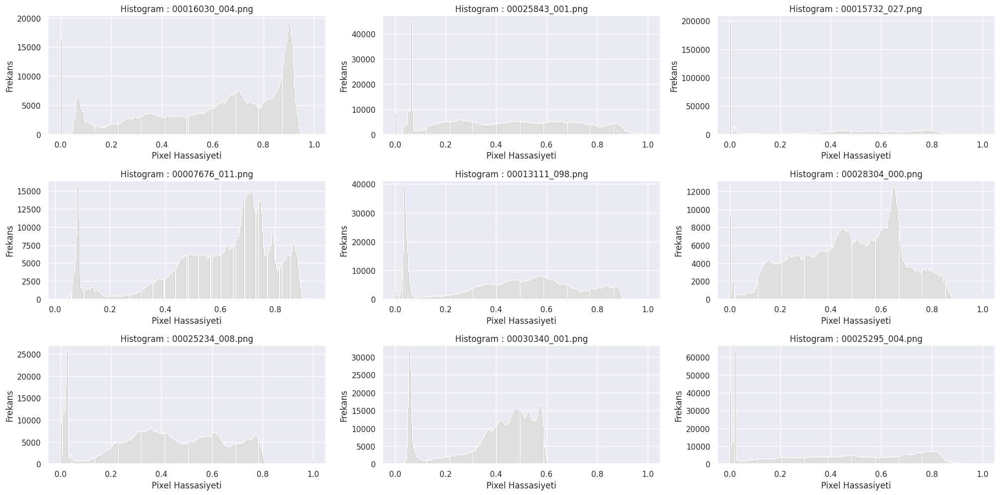

In [60]:
plt.figure(figsize=[20,10])
for i, image_filename in enumerate(random_images):
    # Görüntüleri okuyoruz
    img_path = os.path.join(img_dir, image_filename)
    img = plt.imread(img_path)

    # Histagram oluşturarak ekrana basıyoruz
    plt.subplot(3, 3, i + 1)
    plt.hist(img.ravel(), bins=256, color='gray')
    plt.title(f"Histogram : {image_filename}")
    plt.xlabel("Pixel Hassasiyeti")
    plt.ylabel("Frekans")

plt.tight_layout()
plt.show()

## 3. Görüntü İşleme ve İyileştirme

**1.	Kontrast Germe (Stretching)**

*   Minimum ve maksimum piksel değerlerini kullanarak kontrast germe işlemi yapın.

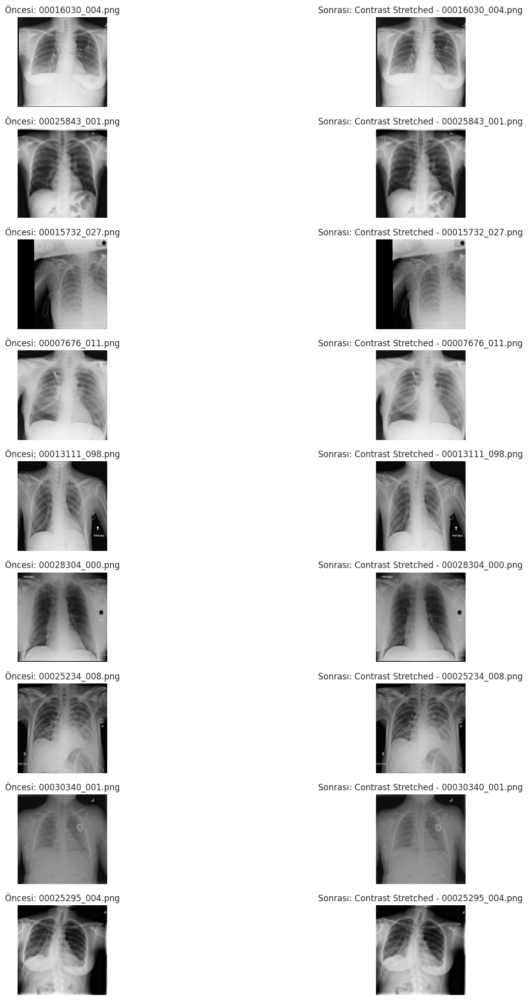

In [61]:
plt.figure(figsize=fsize)
stretched_images = []
for i, image_filename in enumerate(random_images):
    # Görüntüleri okuyoruz
    img_path = os.path.join(img_dir, image_filename)
    img = plt.imread(img_path)

    # Kontrast germe işlemi yapıyoruz
    pmin, pmax = img.min(), img.max()
    img_stretched = (img - pmin) / (pmax - pmin)
    img_stretched = (img_stretched * 255).astype(np.uint8)

    # Gerilmiş resmi listeye ekliyoruz
    stretched_images.append(img_stretched)

    # İşlem öncesi resmi ilk sütunda, işlem sonrası resmi ikinci sütunda göstereceğiz
    plt.subplot(9, 2, 2 * i + 1)  # İlk sütun, işlem öncesi resimler
    plt.imshow(img, cmap='gray')
    plt.title(f"Öncesi: {image_filename}")
    plt.axis('off')

    plt.subplot(9, 2, 2 * i + 2)  # İkinci sütun, işlem sonrası resimler
    plt.imshow(img_stretched, cmap='gray')
    plt.title(f"Sonrası: Contrast Stretched - {image_filename}")
    plt.axis('off')

plt.tight_layout()
plt.show()

**2.	Histogram Eşitleme (Equalization)**

*   Kontrast germe işlemi sonrası histogram eşitleme uygulayarak kontrastı artırın.


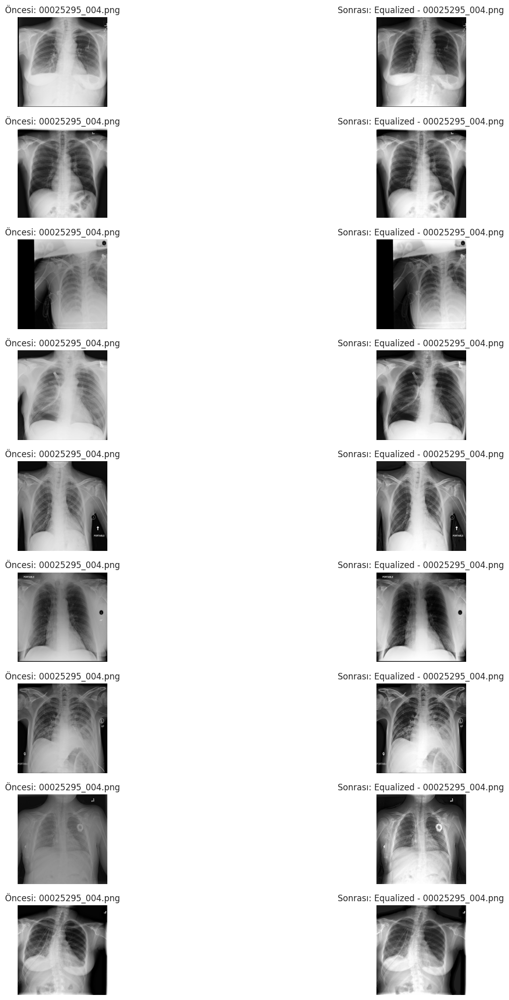

In [62]:
plt.figure(figsize=fsize)
equalized_images = []
for i, img in enumerate(stretched_images):

    # Histogram eşitleme uyguluyoruz
    img_equalized = exposure.equalize_hist(img)
    img_equalized = (img_equalized * 255).astype(np.uint8) # Scale to [0, 255]

    # Histogram eşitleme uyguladığımız resimleri listeye ekliyoruz
    equalized_images.append(img_equalized)

    # İşlem öncesi resmi ilk sütunda, işlem sonrası resmi ikinci sütunda göstereceğiz
    plt.subplot(9, 2, 2 * i + 1)  # İlk sütun, işlem öncesi resimler
    plt.imshow(img, cmap='gray')
    plt.title(f"Öncesi: {image_filename}")
    plt.axis('off')

    plt.subplot(9, 2, 2 * i + 2)  # İkinci sütun, işlem sonrası resimler
    plt.imshow(img_equalized, cmap='gray')
    plt.title(f"Sonrası: Equalized - {image_filename}")
    plt.axis('off')

plt.tight_layout()
plt.show()

**3.	Gamma Düzeltme**

*   Gamma düzeltme yöntemi ile resimnün parlaklığını ayarlayın.


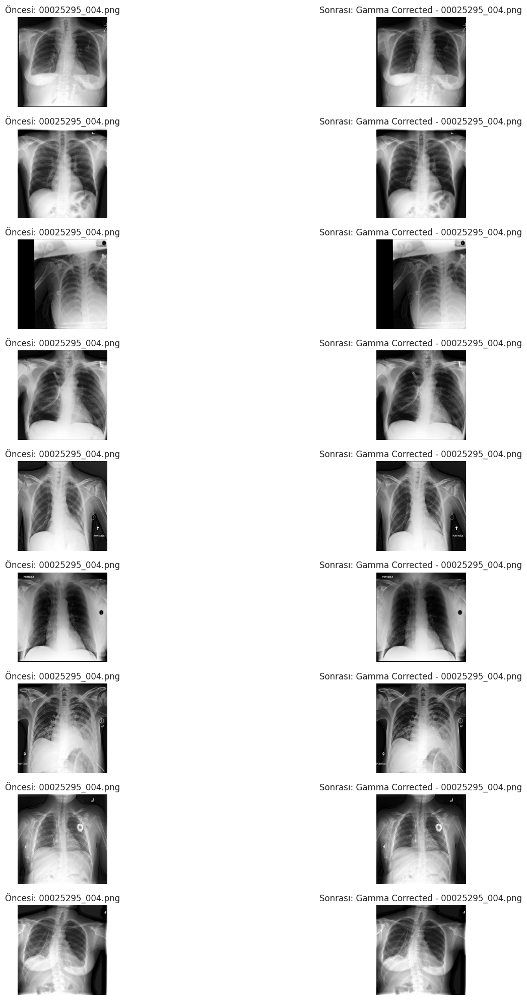

In [63]:
plt.figure(figsize=fsize)
gamma_images = []

for i, img in enumerate(equalized_images):
    # Gamma düzeltmesi yapıyoruz
    gamma = 1.2
    img_gamma_corrected = np.power(img / 255.0, gamma) * 255
    img_gamma_corrected = img_gamma_corrected.astype(np.uint8)

    # Gamma düzeltmesi uyguladığımız resimleri listeye ekliyoruz
    gamma_images.append(img_gamma_corrected)

    # İşlem öncesi resmi ilk sütunda, işlem sonrası resmi ikinci sütunda göstereceğiz
    plt.subplot(9, 2, 2 * i + 1)  # İlk sütun, işlem öncesi resimler
    plt.imshow(img, cmap='gray')
    plt.title(f"Öncesi: {image_filename}")
    plt.axis('off')

    plt.subplot(9, 2, 2 * i + 2)  # İkinci sütun, işlem sonrası resimler
    plt.imshow(img_gamma_corrected, cmap='gray')
    plt.title(f"Sonrası: Gamma Corrected - {image_filename}")
    plt.axis('off')

plt.tight_layout()
plt.show()

## 4. Gürültü Azaltma

**1.	Median ve Gaussian Blur Uygulama**

*   Gamma düzeltilmiş resimye median ve gaussian blur uygulayın ve sonuçları karşılaştırın.


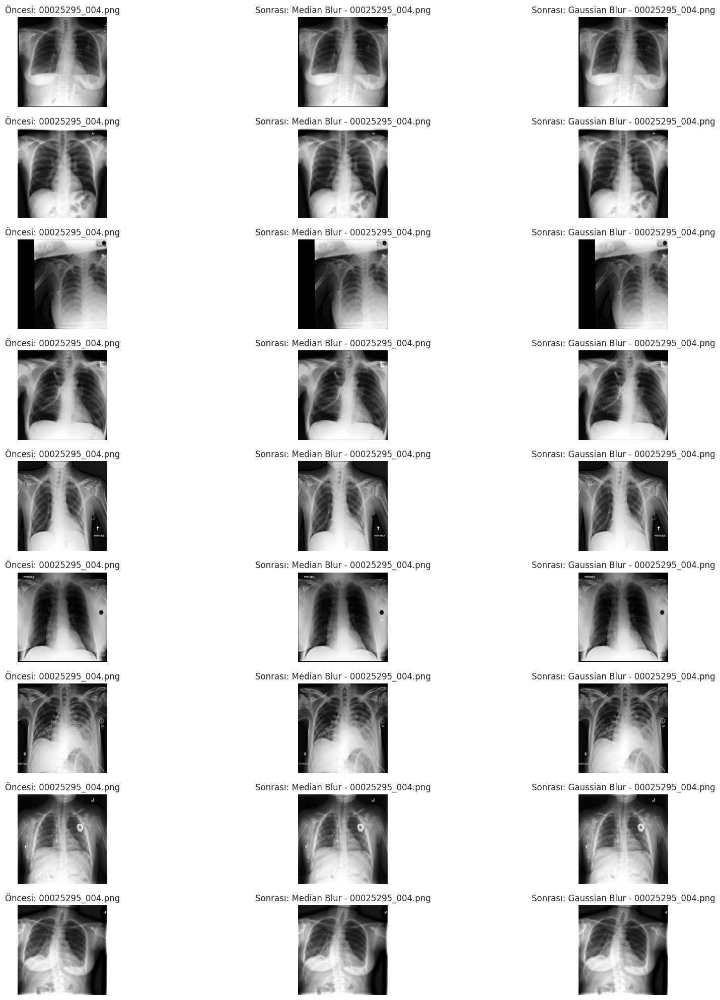

In [64]:
plt.figure(figsize=fsize)
median_blurred_images =[]
gaussian_blurred_images =[]

for i, img_gamma_corrected in enumerate(gamma_images):
    # Median Blur'u uyguluyoruz
    median_blurred = cv2.medianBlur(img_gamma_corrected, 5)
    median_blurred_images.append(median_blurred)

    # Gaussian Blur'u uyguluyoruz
    gaussian_blurred = cv2.GaussianBlur(img_gamma_corrected, (5, 5), 0)
    gaussian_blurred_images.append(gaussian_blurred)

    # İşlem öncesi resmi ilk sütunda, işlem sonrası resmi ikinci sütunda göstereceğiz
    plt.subplot(9, 3, 3 * i + 1)  # İlk sütun, işlem öncesi resimler
    plt.imshow(img_gamma_corrected, cmap='gray')
    plt.title(f"Öncesi: {image_filename}")
    plt.axis('off')

    plt.subplot(9, 3, 3 * i + 2)  # İkinci sütun, işlem sonrası resimler
    plt.imshow(median_blurred, cmap='gray')
    plt.title(f"Sonrası: Median Blur - {image_filename}")
    plt.axis('off')

    plt.subplot(9, 3, 3 * i + 3)  # Üçüncü sütun, işlem sonrası resimler
    plt.imshow(gaussian_blurred, cmap='gray')
    plt.title(f"Sonrası: Gaussian Blur - {image_filename}")
    plt.axis('off')

plt.tight_layout()
plt.show()

## 5. Döndürme ve Ayna Çevirme (Flipping)

**1.	Rastgele Açılarla Döndürme**

*   Görüntüyü 0 ile 10 derece arasında rastgele bir açıda döndürün.

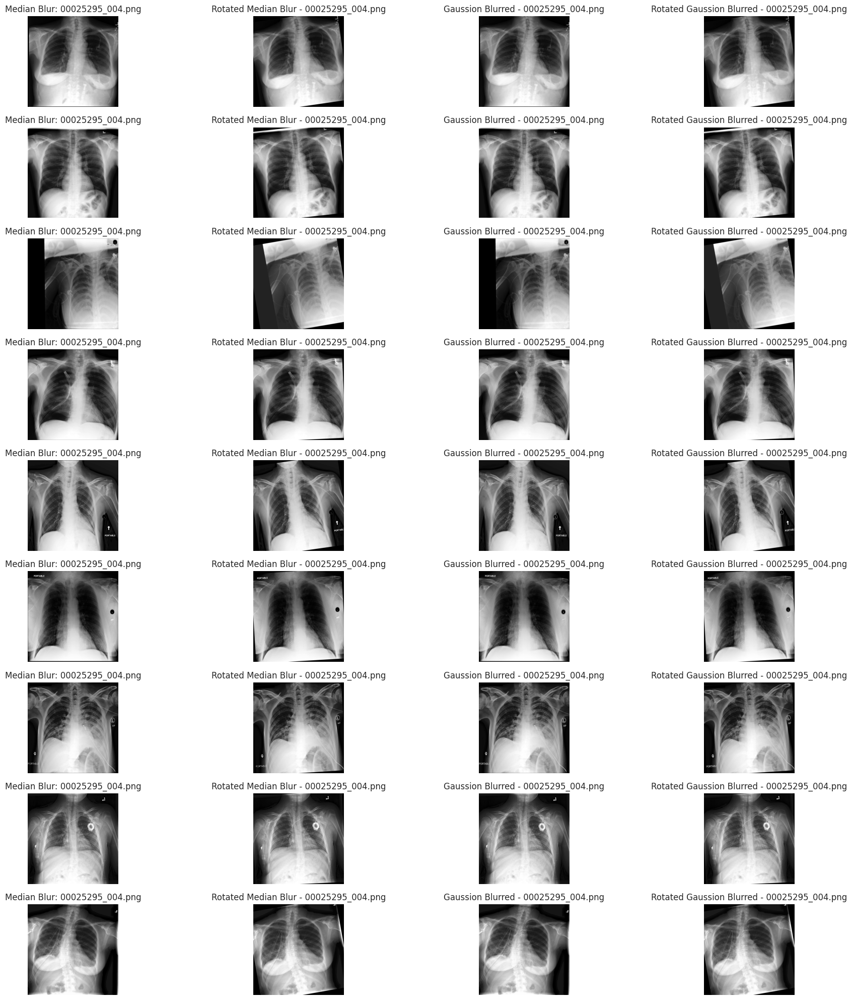

In [65]:
plt.figure(figsize=fsize)
rotated_median_blurred_images =[]
rotated_gaussian_blurred_images =[]

for i, (median_blurred,gaussian_blurred)  in enumerate(zip(median_blurred_images, gaussian_blurred_images)):
    # 0 ile 10 arasında ramdom açı üretiyoruz
    angle = random.uniform(0, 10)

    # Görüntünün dimensin'ını alıyoruz
    (h, w) = median_blurred.shape[:2]
    center = (w // 2, h // 2)

    # Rotation matrix alıyoruz
    M = cv2.getRotationMatrix2D(center, angle, 1.0)

    # Resimleri döndürüyoruz
    rotated_median = cv2.warpAffine(median_blurred, M, (w, h))
    rotated_median_blurred_images.append(rotated_median)
    rotated_gaussian = cv2.warpAffine(gaussian_blurred, M, (w, h))
    rotated_gaussian_blurred_images.append(rotated_gaussian)

     # İşlem öncesi resmi ilk sütunda, işlem sonrası resmi ikinci sütunda göstereceğiz
    plt.subplot(9, 4, 4 * i + 1)  # İlk sütun, işlem öncesi resimler
    plt.imshow(median_blurred, cmap='gray')
    plt.title(f"Median Blur: {image_filename}")
    plt.axis('off')

    plt.subplot(9, 4, 4 * i + 2)  # İkinci sütun, işlem sonrası resimler
    plt.imshow(rotated_median, cmap='gray')
    plt.title(f"Rotated Median Blur - {image_filename}")
    plt.axis('off')

    plt.subplot(9, 4, 4 * i + 3)  # Üçüncü sütun, işlem öncesi resimler
    plt.imshow(gaussian_blurred, cmap='gray')
    plt.title(f"Gaussion Blurred - {image_filename}")
    plt.axis('off')

    plt.subplot(9, 4, 4 * i + 4)  # Dördüncü sütun, işlem sonrası resimler
    plt.imshow(rotated_gaussian, cmap='gray')
    plt.title(f"Rotated Gaussion Blurred - {image_filename}")
    plt.axis('off')

plt.tight_layout()
plt.show()

**2.	Ayna Çevirme**

*   Görüntüyü yatay olarak çevirin ve sonucu görselleştirin.


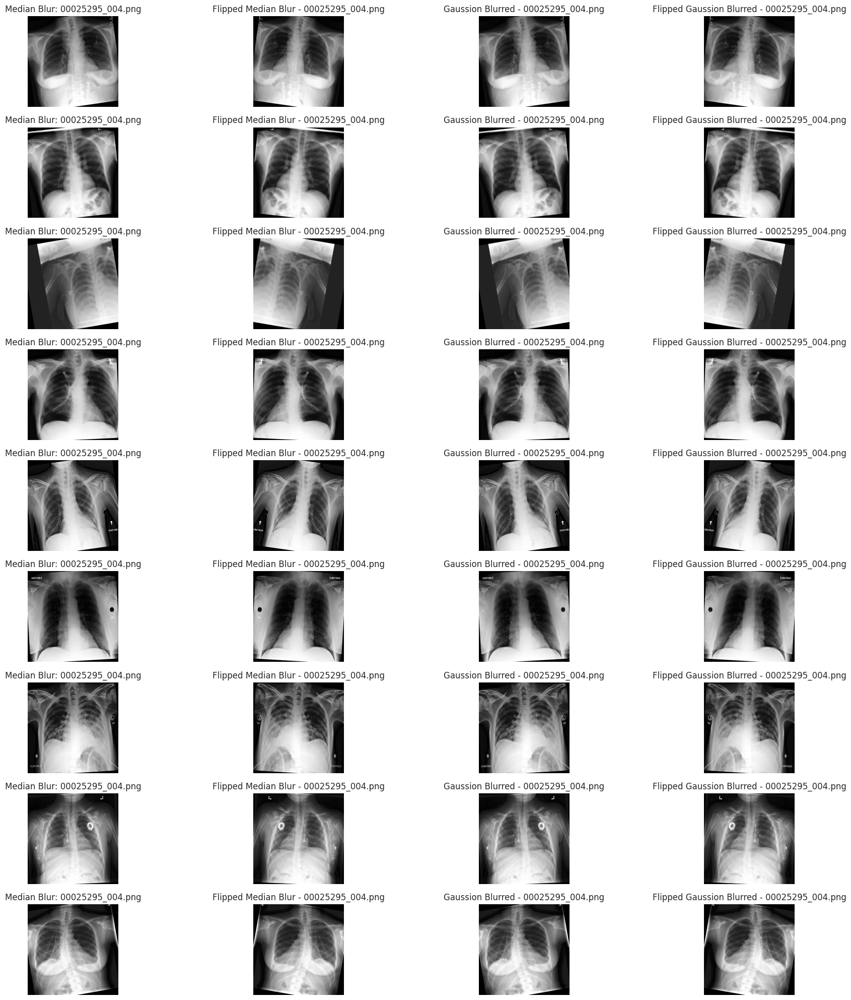

In [66]:
plt.figure(figsize=fsize)
flipped_median_images =[]
flipped_gaussian_images =[]

for i, (rotated_median, rotated_gaussian)  in enumerate(zip(rotated_median_blurred_images, rotated_gaussian_blurred_images)):
    # --- Görüntüyü yata olarak ceviriyoruz
    flipped_median = cv2.flip(rotated_median, 1)
    flipped_median_images.append(flipped_median)

    flipped_gaussian = cv2.flip(rotated_gaussian, 1)
    flipped_gaussian_images.append(flipped_gaussian)

    # İşlem öncesi resmi ilk sütunda, işlem sonrası resmi ikinci sütunda göstereceğiz
    plt.subplot(9, 4, 4 * i + 1)  # İlk sütun, işlem öncesi resimler
    plt.imshow(rotated_median, cmap='gray')
    plt.title(f"Median Blur: {image_filename}")
    plt.axis('off')

    plt.subplot(9, 4, 4 * i + 2)  # İkinci sütun, işlem sonrası resimler
    plt.imshow(flipped_median, cmap='gray')
    plt.title(f"Flipped Median Blur - {image_filename}")
    plt.axis('off')

    plt.subplot(9, 4, 4 * i + 3)  # Üçüncü sütun, işlem öncesi resimler
    plt.imshow(rotated_gaussian, cmap='gray')
    plt.title(f"Gaussion Blurred - {image_filename}")
    plt.axis('off')

    plt.subplot(9, 4, 4 * i + 4)  # Dördüncü sütun, işlem sonrası resimler
    plt.imshow(flipped_gaussian, cmap='gray')
    plt.title(f"Flipped Gaussion Blurred - {image_filename}")
    plt.axis('off')

plt.tight_layout()
plt.show()

## 6. Frekans Alanında Filtreleme

**1.	Fourier Dönüşümü ve Filtreleme**

*   Fourier dönüşümü ile görüntüyü frekans alanına çevirin, düşük frekansları geçiren bir maske uygulayın, ardından ters Fourier dönüşümü ile frekans alanında filtreleme yapın.


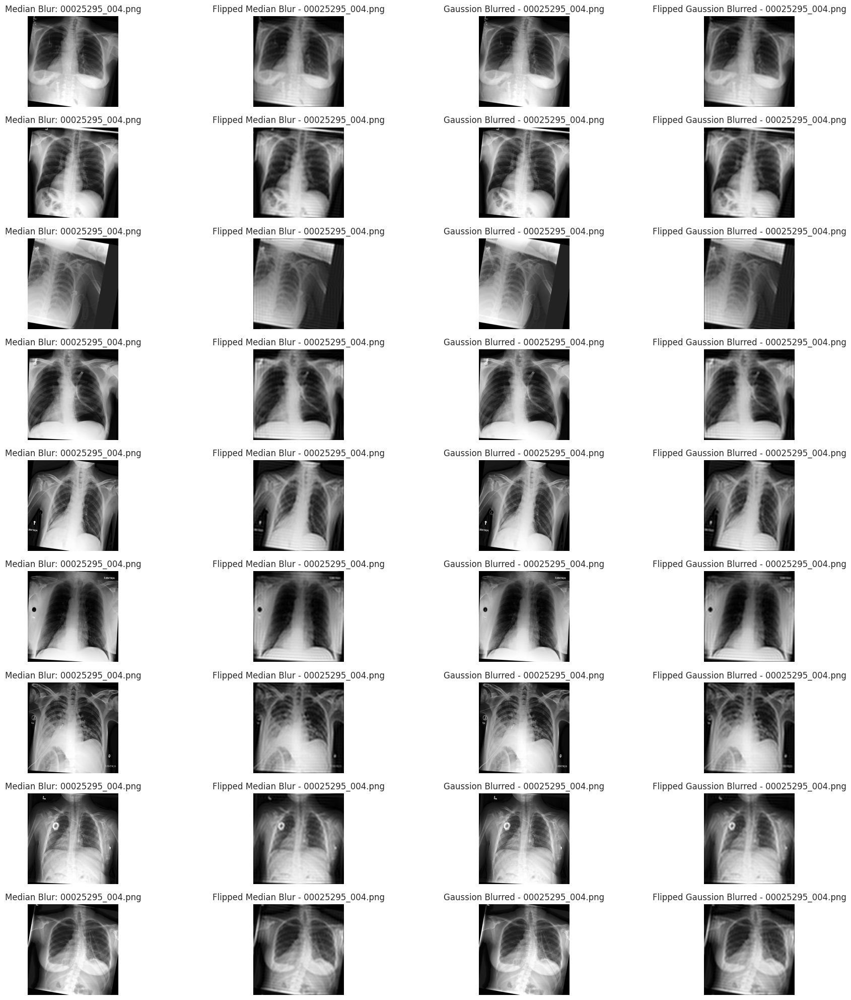

In [67]:
plt.figure(figsize=fsize)
fourier_median_images =[]
fourier_gaussian_images =[]

for i, (flipped_median, flipped_gaussian)  in enumerate(zip(flipped_median_images, flipped_gaussian_images)):
    old_flipped_median = flipped_median
    old_flipped_gaussian = flipped_gaussian

    # --- Fourier Dönüşümü ve Filtreleme ---
    for img in [flipped_median, flipped_gaussian]:
        # 1. Fourier dönüşümü yapıyoruz
        dft = cv2.dft(np.float32(img), flags=cv2.DFT_COMPLEX_OUTPUT)
        dft_shift = np.fft.fftshift(dft)

        # 2. Düşük frekansları geçiren bir maske uyguluyoruz
        rows, cols = img.shape
        crow, ccol = rows // 2, cols // 2
        mask = np.zeros((rows, cols, 2), np.uint8)
        mask[crow - 30:crow + 30, ccol - 30:ccol + 30] = 1

        # 3. Maske ve ters fourier dönüşümü uyguluyoruz
        fshift = dft_shift * mask
        f_ishift = np.fft.ifftshift(fshift)
        img_back = cv2.idft(f_ishift)
        img_back = cv2.magnitude(img_back[:, :, 0], img_back[:, :, 1])

        # Orijinal resimlere atama yapıyoruz
        if img is flipped_median:
            flipped_median = img_back
        else:
            flipped_gaussian = img_back

    fourier_median_images.append(flipped_median)
    fourier_gaussian_images.append(flipped_gaussian)

    # İşlem öncesi resmi ilk sütunda, işlem sonrası resmi ikinci sütunda göstereceğiz
    plt.subplot(9, 4, 4 * i + 1)  # İlk sütun, işlem öncesi resimler
    plt.imshow(old_flipped_median, cmap='gray')
    plt.title(f"Median Blur: {image_filename}")
    plt.axis('off')

    plt.subplot(9, 4, 4 * i + 2)  # İkinci sütun, işlem sonrası resimler
    plt.imshow(flipped_median, cmap='gray')
    plt.title(f"Flipped Median Blur - {image_filename}")
    plt.axis('off')

    plt.subplot(9, 4, 4 * i + 3)  # Üçüncü sütun, işlem öncesi resimler
    plt.imshow(old_flipped_gaussian, cmap='gray')
    plt.title(f"Gaussion Blurred - {image_filename}")
    plt.axis('off')

    plt.subplot(9, 4, 4 * i + 4)  # Dördüncü sütun, işlem sonrası resimler
    plt.imshow(flipped_gaussian, cmap='gray')
    plt.title(f"Flipped Gaussion Blurred - {image_filename}")
    plt.axis('off')

plt.tight_layout()
plt.show()

## 7. Keskinleştirme ve Enterpolasyon

**1.	Keskinleştirme**

*   Unsharp masking tekniği kullanarak görüntüyü keskinleştirin.


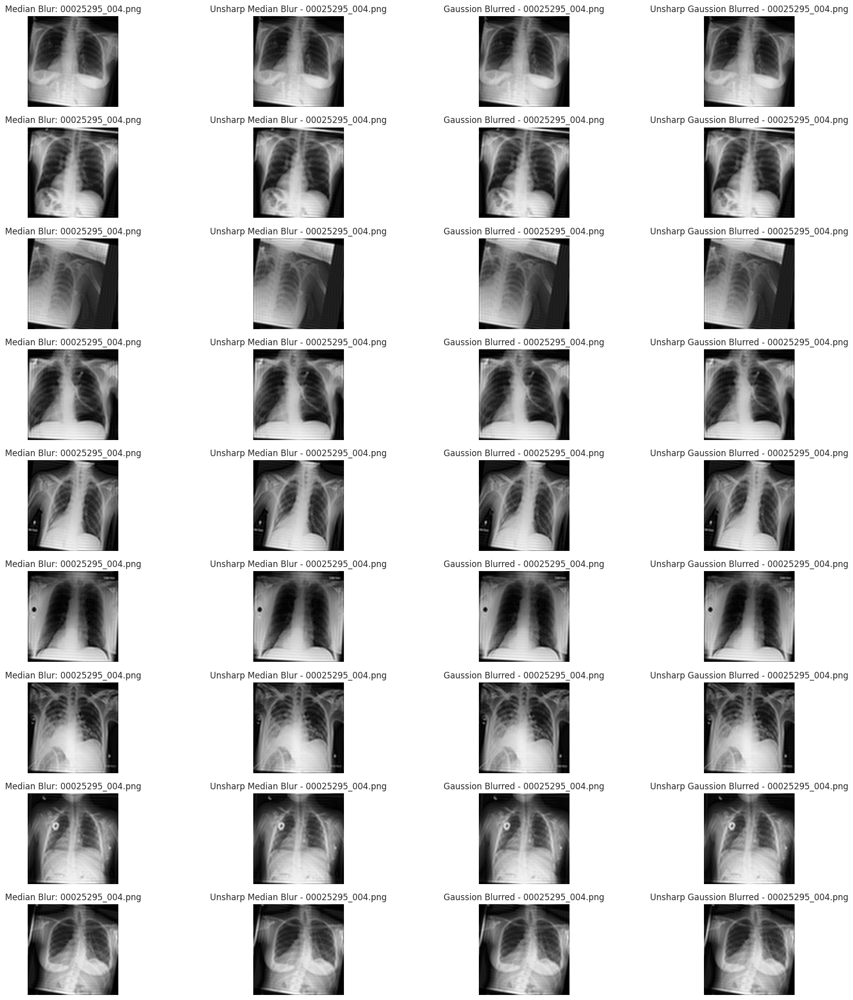

In [68]:
plt.figure(figsize=fsize)
unsharp_median_images =[]
unsharp_gaussian_images =[]

for i, (fourie_median, fourie_gaussian)  in enumerate(zip(fourier_median_images, fourier_gaussian_images)):
    unsharp_median = None
    unsharp_gaussian = None
    # --- Unsharp Masking Uygulaması---
    for img in [fourie_median, fourie_gaussian]:
        sharpened = cv2.addWeighted(img.astype(np.float32), 1.5, img, -0.5, 0)

        # Orijinal resimlere atama yapıyoruz
        if img is fourie_median:
            unsharp_median = sharpened
        else:
            unsharp_gaussian = sharpened

    unsharp_median_images.append(unsharp_median)
    unsharp_gaussian_images.append(unsharp_gaussian)

    # İşlem öncesi resmi ilk sütunda, işlem sonrası resmi ikinci sütunda göstereceğiz
    plt.subplot(9, 4, 4 * i + 1)  # İlk sütun, işlem öncesi resimler
    plt.imshow(fourie_median, cmap='gray')
    plt.title(f"Median Blur: {image_filename}")
    plt.axis('off')

    plt.subplot(9, 4, 4 * i + 2)  # İkinci sütun, işlem sonrası resimler
    plt.imshow(unsharp_median, cmap='gray')
    plt.title(f"Unsharp Median Blur - {image_filename}")
    plt.axis('off')

    plt.subplot(9, 4, 4 * i + 3)  # Üçüncü sütun, işlem öncesi resimler
    plt.imshow(fourie_gaussian, cmap='gray')
    plt.title(f"Gaussion Blurred - {image_filename}")
    plt.axis('off')

    plt.subplot(9, 4, 4 * i + 4)  # Dördüncü sütun, işlem sonrası resimler
    plt.imshow(unsharp_gaussian, cmap='gray')
    plt.title(f"Unsharp Gaussion Blurred - {image_filename}")
    plt.axis('off')

plt.tight_layout()
plt.show()

**2.	Bicubic Enterpolasyon**

*   Keskinleştirilmiş görüntüyü iki kat büyüterek enterpolasyon uygulayın.


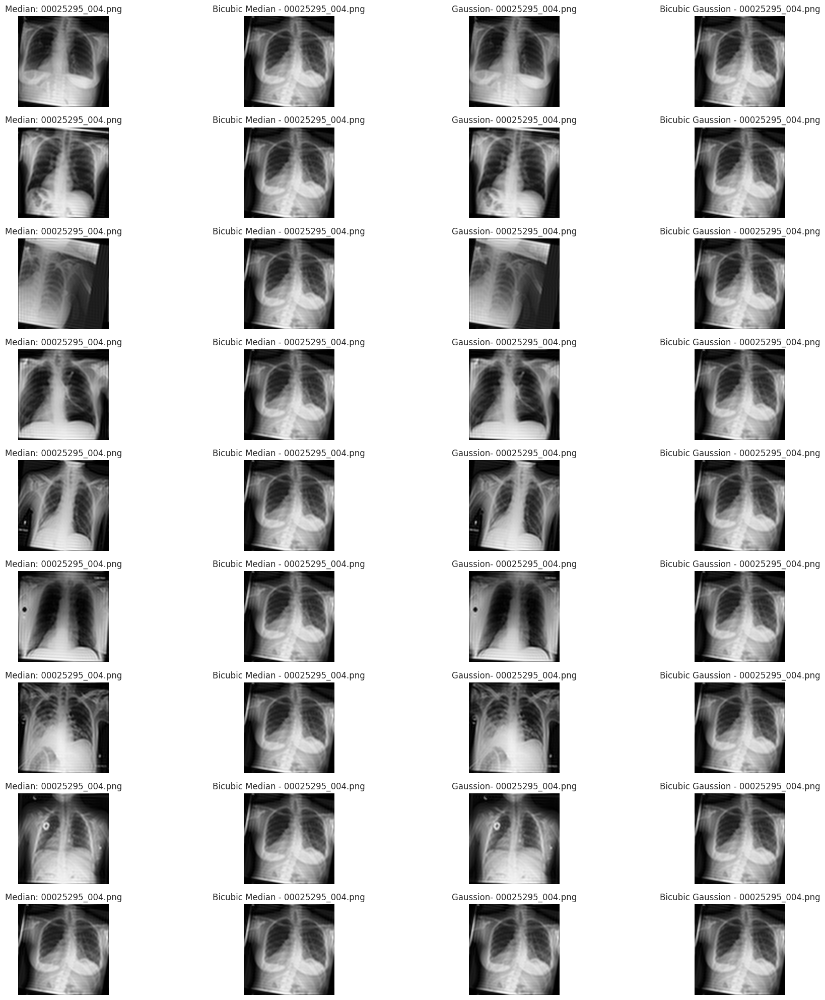

In [69]:
plt.figure(figsize=fsize)

for i, (unsharp_median, unsharp_gaussian)  in enumerate(zip(unsharp_median_images, unsharp_gaussian_images)):
    bicubic_median = None
    bicubic_gaussian = None
    # --- Bicubic Interpolation Uygulaması---
    for img in [flipped_median, flipped_gaussian]:
        upscaled_img = cv2.resize(img, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)

        # Orijinal resimlere atama yapıyoruz
        if img is flipped_median:
            bicubic_median = upscaled_img
        else:
            bicubic_gaussian = upscaled_img

    # İşlem öncesi resmi ilk sütunda, işlem sonrası resmi ikinci sütunda göstereceğiz
    plt.subplot(9, 4, 4 * i + 1)  # İlk sütun, işlem öncesi resimler
    plt.imshow(unsharp_median, cmap='gray')
    plt.title(f"Median: {image_filename}")
    plt.axis('off')

    plt.subplot(9, 4, 4 * i + 2)  # İkinci sütun, işlem sonrası resimler
    plt.imshow(bicubic_median, cmap='gray')
    plt.title(f"Bicubic Median - {image_filename}")
    plt.axis('off')

    plt.subplot(9, 4, 4 * i + 3)  # Üçüncü sütun, işlem öncesi resimler
    plt.imshow(unsharp_gaussian, cmap='gray')
    plt.title(f"Gaussion- {image_filename}")
    plt.axis('off')

    plt.subplot(9, 4, 4 * i + 4)  # Dördüncü sütun, işlem sonrası resimler
    plt.imshow(bicubic_gaussian, cmap='gray')
    plt.title(f"Bicubic Gaussion - {image_filename}")
    plt.axis('off')

plt.tight_layout()
plt.show()